# Assignment 1: Rotation and Transformation Basics

## Objective:
The objective of this assignment is to solidify my understanding of
rotation, transformation, and other basic operations in computer vision. I will
implement these operations from scratch using a programming language (e.g., Python)
and basic libraries like NumPy.

### Installing and importing libraries to be used in this assignment:

In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [3]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

### Images set to be used for visualization

In [4]:
# the images have been placed in the same directory as this notebook
images_list=["pic1.jpg", "pic2.jpg", "pic3.jpg","pic4.jpg"]

## Task 1: Rotation Implementation:

1. Implement a function to perform rotation on a given image by a specified angle
(in degrees).
2. Apply the rotation function to a set of images with varying rotation angles (e.g.,
30°, 60°, -45°) and visualize the results.
3. Compare the results of your rotation implementation with a built-in rotation
function from a popular image processing library (e.g., OpenCV). Discuss any
differences or similarities observed.

### Original Images Visualisation

In [5]:
# function to read image using OpenCV
def read_image(image):
    # if the input is a path to the actual image, read it using OpenCV and convert to RGB color format
    if isinstance(image,str):
        image = cv2.imread(image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # if the input is already a numpy array of the already read image, then I will simply return the same array
    elif isinstance(image,np.ndarray):
        image=image
    else:
        raise ValueError("Check input images!!!") # raise error if any other format is provided as input
        
    return image

In [6]:
# function to display images in one single figure and all the images will be displayed as a sub-figure using matplotlib
def display_images(images):
    '''
    The input to this function is a list of images which
    can be list of paths or list or pre-processed numpy array of pixels.
    '''
    fig = plt.figure(figsize=(20, 20))
    
    for i, image in enumerate(images):
        image=read_image(image)
        
        ax = fig.add_subplot(1, len(images), i+1)
        ax.imshow(image)
        ax.axis('off')
        plt.title("Image No. "+str(i+1))        
    
    plt.show()

The read_image() and display_images() functions are going to be used throughout this notebook to ease my work and accomplish the tasks efficiently without repeating same code again and again. This is also an example of modularizing code.

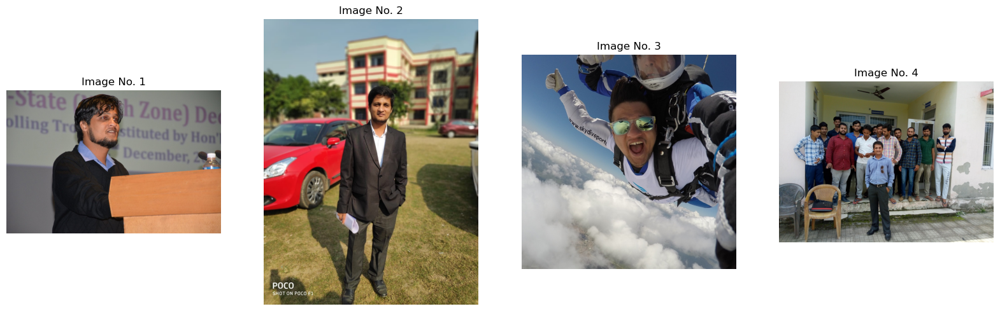

In [7]:
# let's see the original images
display_images(images_list)

### Function to implement rotation transformation without using OpenCV

In [8]:
def rotation_without_using_opencv(images_list, angle_deg):
    '''
    The inputs to this function:
    1. images_list ==> list of images
    2. angle_deg ==> angle by which we wish to rotate our image (in degrees)
    '''
    tran_images_list=[] # empty list
    angle_rad = np.deg2rad(angle_deg) # convert degrees to radians to compute cos and sin values
    for i, image in enumerate(images_list):
        image=read_image(image)
        
        #original image dimensions
        height_orig, width_orig, _ = image.shape
        center_orig_x, center_orig_y = width_orig//2, height_orig//2
        
        # pre-calculating the max possible height and width of the rotated image to avoid edges getting cropped
        # the transformation matrix is helpful in this calculation
        height_tran = round(np.abs(height_orig*np.cos(angle_rad)) + np.abs(width_orig*np.sin(angle_rad)))
        width_tran = round(np.abs(width_orig*np.cos(angle_rad)) + np.abs(height_orig*np.sin(angle_rad)))
        center_tran_x, center_tran_y = width_tran//2, height_tran//2
        
        # setting up an empty canvas of complete black image to be replaced with image pixels later
        tran_image = np.zeros((height_tran,width_tran,image.shape[2])).astype("uint8")
        
        # two 'for' loops (for width and height) will calculate and replace every pixel from the original image onto the canvas
        # center points of original and canvas image help in offsetting the image to avoid edge cropping
        for w in range(width_tran):
            for h in range(height_tran):
                #transformation matrix multiplication and offset compensation
                x= round((w-center_tran_x)*np.cos(angle_rad)-(h-center_tran_y)*np.sin(angle_rad)+center_orig_x)
                y= round((w-center_tran_x)*np.sin(angle_rad)+(h-center_tran_y)*np.cos(angle_rad)+center_orig_y)

                # the original image pixels are present only in the range used in the if condition below
                if (0<=x<width_orig and 0<=y<height_orig):
                    tran_image[h,w,:] = image[y,x,:]
        
        tran_images_list.append(tran_image) # keep appending to the list of rotated images
    
    return tran_images_list

### Rotation transformation using OpenCV

In [9]:
# this function uses OpenCV to do the rotation
def rotation_using_opencv(images_list, angle):
    '''
    The inputs to this function:
    1. images_list ==> list of images
    2. angle_deg ==> angle by which we wish to rotate our image (in degrees)
    '''
    tran_images_list=[]
    for i, image in enumerate(images_list):
        image=read_image(image)
        height, width = image.shape[:2]
        center = tuple(np.array([height,width])/2)
        rotation_matrix = cv2.getRotationMatrix2D(center,angle,1) # using inbuilt method to calculate transformation matrix
        image = cv2.warpAffine(image, rotation_matrix, (height,width))
        tran_images_list.append(image)
    
    return tran_images_list

### Visualisation of transformed images and comparison of my function versus OpenCV

                                     Rotation by 0 degrees                                      


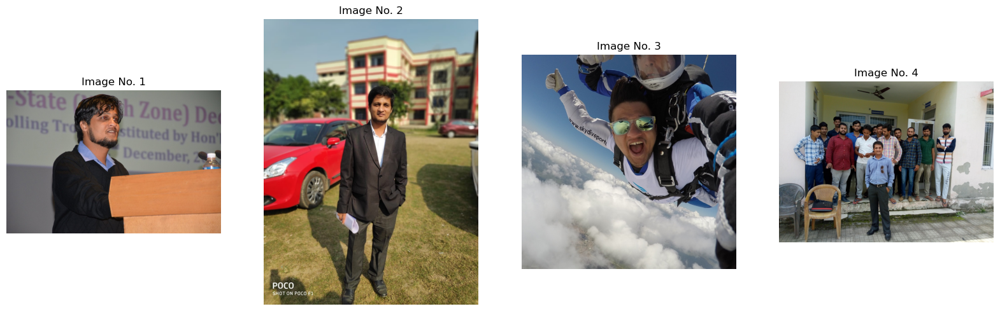

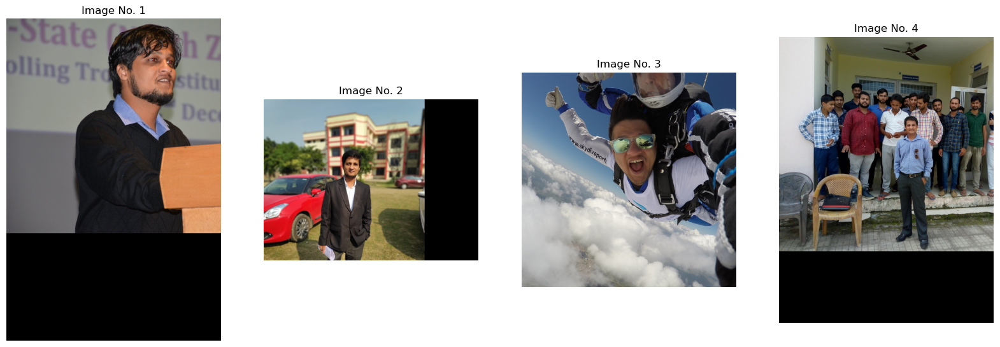



                                     Rotation by 30 degrees                                     


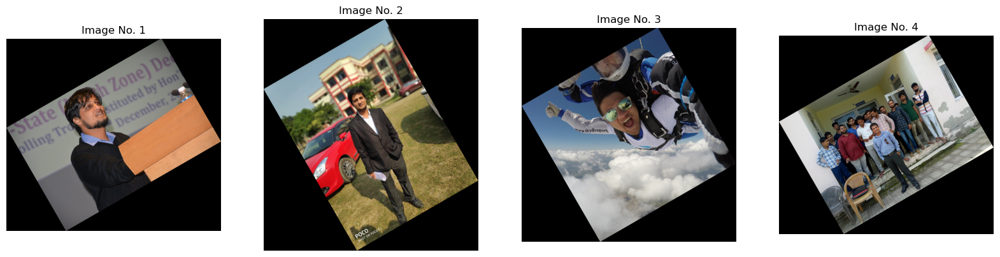

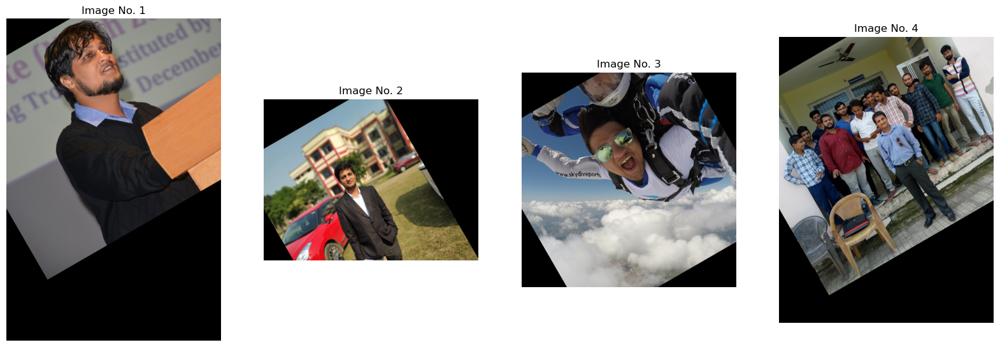



                                     Rotation by 60 degrees                                     


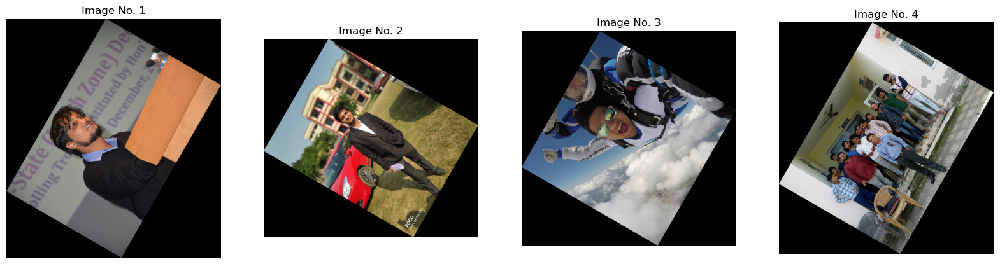

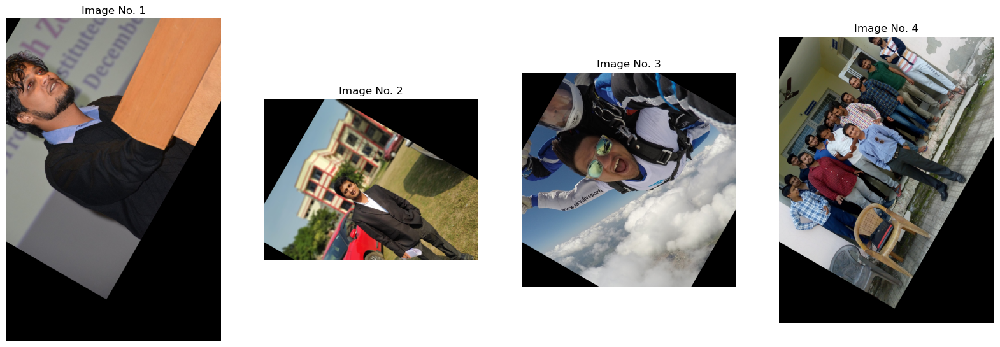



                                    Rotation by -45 degrees                                     


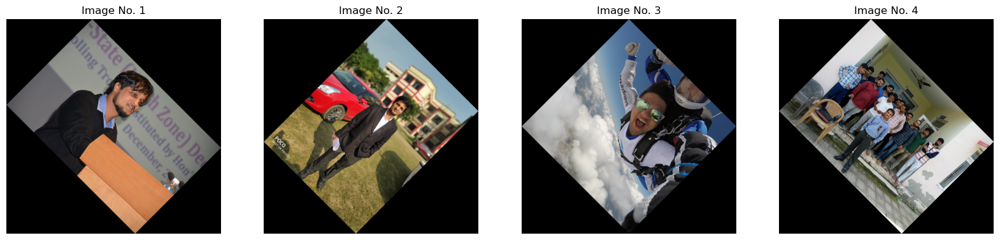

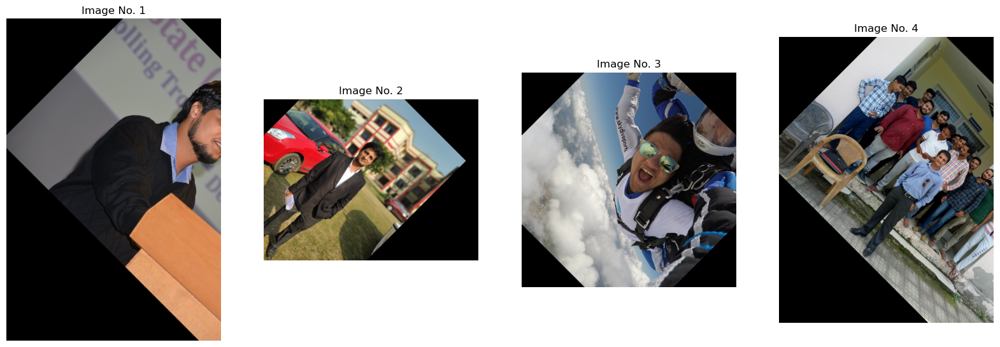



                                     Rotation by 90 degrees                                     


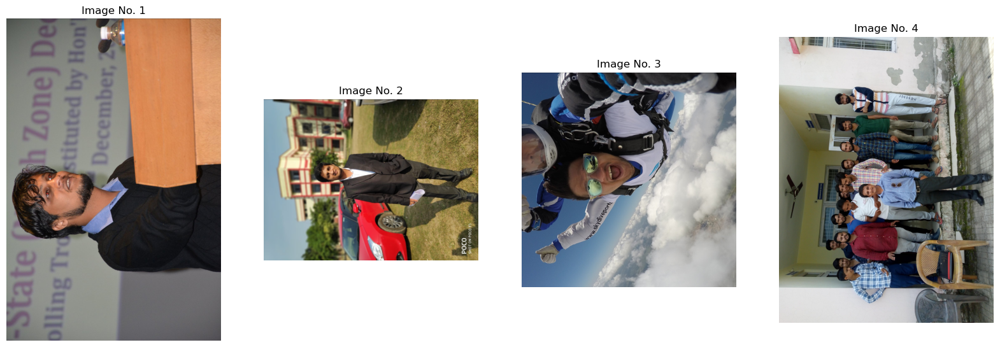

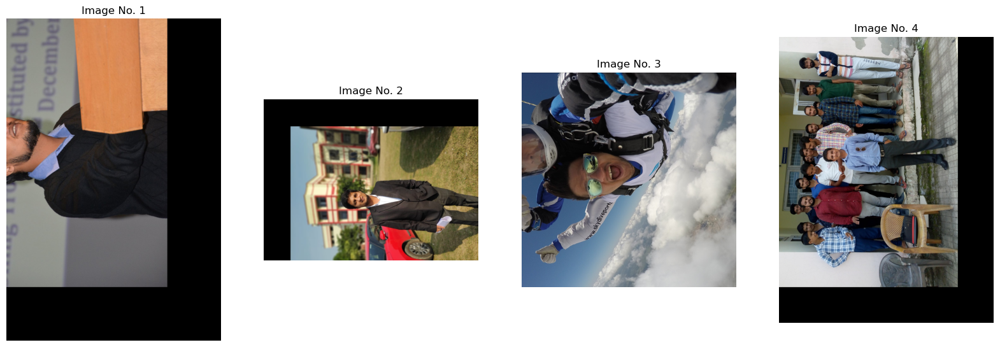

In [10]:
# performing rotation operation on the set of images for varrying rotation angles (in degrees) 
# so as to compare the outputs of self-defined function and the OpenCV methods

angles_list=[0,30,60,-45,90]

for angle in angles_list:
    print(('\033[1m' +"Rotation by "+str(angle)+" degrees").center(100))
    
    # first we display the images rotated without using OpenCV (self-defined)
    rotated_images=rotation_without_using_opencv(images_list, angle)
    display_images(rotated_images)
    
    # then we display the images rotated using OpenCV
    rotated_images=rotation_using_opencv(images_list, angle)
    display_images(rotated_images)
    print("\n")

### Comparison of rotated images produced by the self-defined function and by the OpenCV library function

1. When I rotated images by 0 degrees, I expected no change in the images as original images, however the OpenCV function produced images which are cropped(except square dimension image (no. 3)), while images produced by my function didn't crop any of the image.
2. Rotation by angles 30, 60 and -45 produced cropped images when using OpenCV but there is no such cropping in the images produced by my function.
3. When I rotated images by 90 degrees, I expected that even the images produced by OpenCV wouln't get cropped as the angle is 90 degrees and the image can be simply rotated, but as can be seen above that OpenCV produced cropped images even for 90 degrees.
4. It can be easily observed that OpenCV images rotates images and there is some offset from the original image due to which we see that images get cropped.
5. The only situation where images are not getting cropped by OpenCV is when the input image is a square dimension image (Image No. 3).
6. None of the image produced by my function has been cropped.
7. Also, it can be seen that images produced by my function seem little smaller (scaled down) when compared to the images prodcued by OpenCV but this is happening becuase matplotlib adjusts the image display according to the figure plot and subplots (as defined in the display_images() function above).

The images produced by OpenCV guided me to calculate the dimensions of the rotated image before performing the rotation and that by compensating the offset we can get images without any loss of pixels (edge cropping).

I could have also pre-calculated the dimensions of the rotated images and the center of the rotated image before passing these parameters to the OpenCV functions and then OpenCV would have also produced images without any edge cropping but I didn't do that to present that by default OpenCV doesn't do that ! :)

## Task 2: Transformation Matrix Calculation

1. Implement a function to calculate the transformation matrix for a given
translation (dx, dy) and scaling factors (sx, sy).
2. Apply the transformation matrix to a set of images along with the translation and
scaling parameters.
3. Visualize and compare the transformed images with the original ones.

In [11]:
# function to calculate the transformation matrix for given translation and scaling factors
def transformation_matrix_translation_scaling(translation=(0, 0), scaling=(1, 1)):
    '''
    Inputs:
    1. translation ==> translation factors (dx, dy) [(0,0) by default for No Translation]
    2. scaling ==> scaling factors (sx, sy) [(1,1) by default for No Scaling]
    '''
    
    dx, dy = translation
    sx, sy = scaling
    
    #creating an identity matrix
    tran_mat = np.eye(3)
    
    #assigning appropriate translation and scaling factors to the identity matrix to form the transformation matrix
    tran_mat[0, 2] = dx
    tran_mat[1, 2] = dy
    tran_mat[0, 0] = sx
    tran_mat[1, 1] = sy
    
    return tran_mat

In [12]:
# fucntion to perform translation and scaling withtout using OpenCV or any other built-in library functions
def translation_scaling_without_opencv(images_list,translation=(0, 0), scaling=(1, 1)):
    '''
    Inputs:
    1. images_list ==> list of images
    2. translation ==> translation factors (dx, dy) [(0,0) by default for No Translation]
    3. scaling ==> scaling factors (sx, sy) [(1,1) by default for No Scaling]
    '''
    tran_images_list=[] # empty list
    for i, image in enumerate(images_list):
        image=read_image(image)
        
        #dimensions of original image
        height_orig, width_orig, _ = image.shape
        
        #calculating the transformation matrix using function defined above
        tran_matrix=transformation_matrix_translation_scaling(translation, scaling)
        
        # pre-calculating the max possible height and width of the transformed image to avoid edges getting cropped
        # if the scaling factors are greater than 1, multiply by the factor after adding the translation factor
        # if the scaling factors are lesser than 1, simply add the translation factor without scalar factor multiplication
        if tran_matrix[1, 1]>1:
            height_tran = round((height_orig+abs(int(tran_matrix[1, 2])))*tran_matrix[1, 1])
        else:
            height_tran = height_orig+abs(int(tran_matrix[1, 2]))
            
        if tran_matrix[0, 0]>1:
            width_tran = round((width_orig+abs(int(tran_matrix[0, 2])))*tran_matrix[0, 0])
        else:
            width_tran = width_orig+abs(int(tran_matrix[0, 2]))
        
        # setting up an empty canvas of complete black image to be replaced with image pixels later
        tran_image = np.zeros((height_tran,width_tran,image.shape[2])).astype("uint8")
        
        # two 'for' loops (for width and height) will calculate and replace every pixel from the original image onto the canvas
        for w in range(width_tran):
            for h in range(height_tran):
                x= round((w-tran_matrix[0, 2])/tran_matrix[0, 0]) # w=x.sx+dx ==> x = (w-dx)/sx
                y= round((h-tran_matrix[1, 2])/tran_matrix[1, 1]) # h=y.sy+dy ==> y = (h-dy)/sy
                
                # the original image pixels are present only in the range used in the if condition below
                if (0<=x<width_orig and 0<=y<height_orig):
                    tran_image[h,w,:] = image[y,x,:]
        
        tran_images_list.append(tran_image) # keep appending to the list of transformed images
    
    return tran_images_list

### Applying transformation matrix defined above to a set of images and Visualizing transformed images

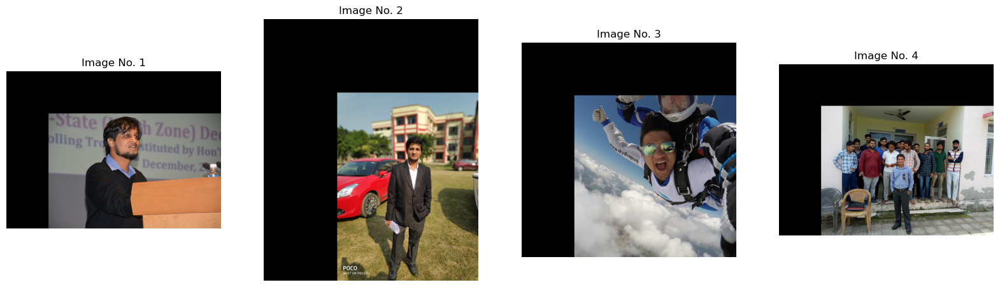

In [13]:
# transforming images by (500,500 translation) and (1,1) scaling
trans_scaled_images = translation_scaling_without_opencv(images_list, (500,500), (1,1))

# displaying transformed images
display_images(trans_scaled_images)

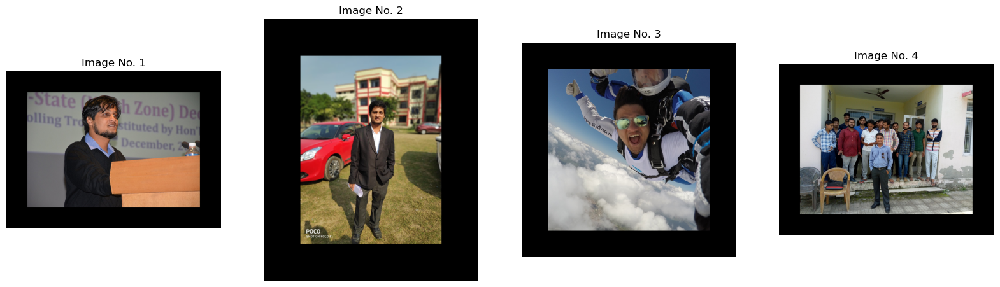

In [14]:
# transforming images by (500,500 translation) and (2,2) scaling
trans_scaled_images = translation_scaling_without_opencv(images_list, (500,500), (2,2))

# displaying transformed images
display_images(trans_scaled_images)

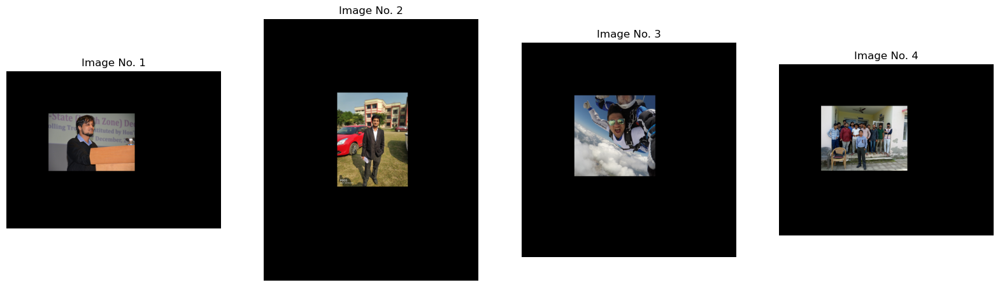

In [15]:
# transforming images by (500,500 translation) and (0.5,0.5) scaling
trans_scaled_images = translation_scaling_without_opencv(images_list, (500,500), (0.5,0.5))

# displaying transformed images
display_images(trans_scaled_images)

### Visualizing original images again

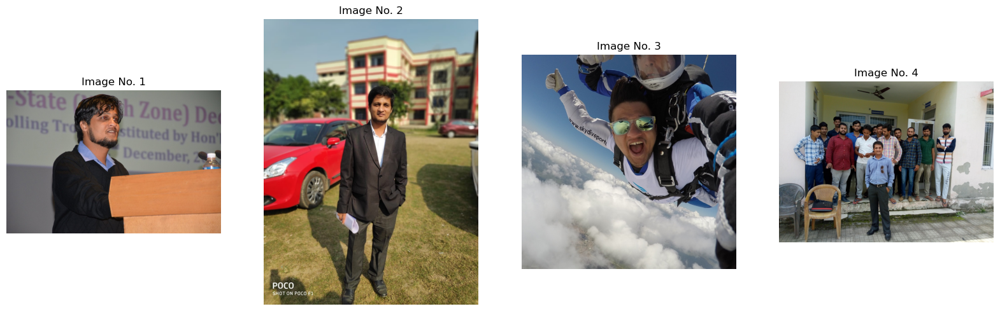

In [16]:
display_images(images_list)

### Comparing transformed images with the original ones

1. We can clearly see that the transformed images have been translated to different positions.
2. When scaling is (1,1), it is clear that no scaling has been performed as the edges perfectly align with the canvas, however when scaling is (2,2), the image have been scaled up by factor of 2 and therefore the canvas has also been increased as can be seen with the border across the edges.
3. I have pre-emptively calculated the dimensions of the transformed images before performing transformation operations so that transformed images are without any edge cropping.
4. When the scaling factor is greater than 1, I have scaled up the dimension of final image also by the same factor to avoid image cropping, however when the scaling facor is lesser than 1, then no need to scale up the dimension of the final image. But at the same time, I have not scaled down the dimension as well, so that I can visualize original image getting scaled down.
5. Also, it can be seen that images produced by my function seem little smaller (scaled down) even with (1,1) scaling ie. no scaling, when compared to the original images. This is happening becuase we have performed no scaling (1,1) but still to accomodate (500,500) translation and avoid image cropping, matplotlib adjusts the image display according to the figure plot and subplots (as defined in the display_images() function above)

## Task 3: Combining Transformations

1. Implement a function that combines multiple transformations (e.g., rotation
followed by translation).
2. Apply the combined transformation to a set of images and visualize the results.
3. Discuss the order of applying transformations and its impact on the final outcome

In this task, I will use the functions I created above thereby taking the benefit of a modular code :)

In [17]:
# function to combine Rotation (R), Translation (T) and Scaling (S) operations in the order: R --> T and S
def rotation_translation_scaling(images_list, angle_deg, translation=(0, 0), scaling=(1, 1)):
    '''
    Inputs:
    1. images_list ==> list of images
    2. angle_deg ==> angle by which we wish to rotate our image (in degrees)
    3. translation ==> translation factors (dx, dy) [(0,0) by default for No Translation]
    4. scaling ==> scaling factors (sx, sy) [(1,1) by default for No Scaling]
    '''
    # perform rotation first
    rotated_images=rotation_without_using_opencv(images_list, angle_deg)
    
    # perform translation and scaling on rotated images
    final_images=translation_scaling_without_opencv(rotated_images, translation, scaling)
    
    return final_images

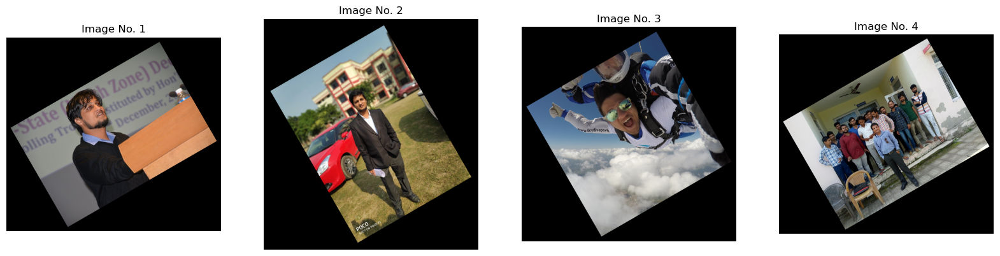

In [18]:
# rotating images by 30 degrees followed by (100,100) translation and (2,2) scaling
mul_tran_images=rotation_translation_scaling(images_list, 30, (100,100), (2,2))

# displaying the transformed images
display_images(mul_tran_images)

In [19]:
# dimensions of the first transformed image
mul_tran_images[0].shape

(4612, 5112, 3)

### Changing the order of transformation operations to analyse further

In [20]:
# function to combine Translation (T) and Scaling (S) and Rotation (R) operations in the order: T and S --> R
def translation_scaling_rotation(images_list, angle_deg, translation=(0, 0), scaling=(1, 1)):
    '''
    Inputs:
    1. images_list ==> list of images
    2. angle_deg ==> angle by which we wish to rotate our image (in degrees)
    3. translation ==> translation factors (dx, dy) [(0,0) by default for No Translation]
    4. scaling ==> scaling factors (sx, sy) [(1,1) by default for No Scaling]
    '''
    # perform translation and scaling first
    tran_scaled_images=translation_scaling_without_opencv(images_list, translation, scaling)
    
    # perform rotation on the tranlated and scaled images
    final_images=rotation_without_using_opencv(tran_scaled_images, angle_deg)
    
    return final_images

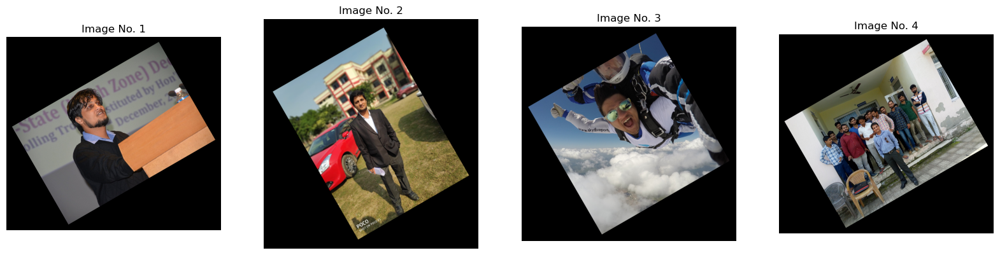

In [21]:
# transforming images by (100,100) translation and (2,2) scaling followed by rotation of 30 degrees
mul_tran_images=translation_scaling_rotation(images_list, 30, (100,100), (2,2))

# displaying the transformed images
display_images(mul_tran_images)

In [22]:
# dimensions of the first transformed image
mul_tran_images[0].shape

(4685, 5185, 3)

### Impact of order of applying transformations on the final transformed images

1. Although the transformed images in both the orders (R --> T and S) and (T and S --> R) seem same, but it is not the reality.
2. It can be seen that both images have different dimensions, as calculated above for the first image in both the orders:
(4612, 5112, 3) and (4685, 5185, 3)
3. Therefore, by changing the order of transformations changes the output dimensions, which can lead to edge croppings in the images. Since in my case, I have taken care of image cropping by pre-emptively calculating the dimensions of the transformed images and thus here we don't see images getting cropped. However, if you observe carefully, you can see difference in the black portion around images is different in the two orders.
4. An intitution behind the difference in the dimensions is that here we are perfoming matrix multiplications and we know that matrix multiplication is not commutative ie. AB != BA
5. Also, it can be seen that images produced by two orders of transformation look same even after we know that they have different dimensions. This is happening becuase matplotlib adjusts the image display according to the figure plot and subplots (as defined in the display_images() function above).